# Load data

# Try two kernel

In [1]:
from IPython.display import SVG, display
from tqdm import tqdm
from pyclustertend import hopkins,ivat
from tqdm import tqdm


import hdbscan
import umap
import pickle
import os
import itertools
import time
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA, FastICA
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

In [2]:
gene_expression = pd.read_csv(
    "/data/g0017139/Set1/CCLE__Affy_hgu133plus2_QCed_mRNA_NoDuplicates_CleanedIdentifiers_RMA-sketch_genelevel_using_jetscore.txt",
    sep=None, engine='python', header=0,
)
gene_expression = gene_expression.T

In [3]:
gene_expression.shape

(1067, 19635)

In [4]:
gene_expression

,1,2,9,10,12,13,14,15,16,18,...,10524,10938,11054,23061,54869,60674,79133,147660,245972,729348
AGENT_p_NCLE_RNA6_HG.U133_Plus_2_A01_436578.CEL,4.223429,3.674479,7.277365,4.145208,4.029598,3.433433,8.946383,3.249680,10.276116,8.101744,...,7.975829,7.666894,6.542198,7.748051,4.514262,12.642093,9.141612,3.779939,5.276707,14.115320
AGENT_p_NCLE_RNA6_HG.U133_Plus_2_A02_436580.CEL,4.384075,3.750469,6.997519,5.128134,3.978323,4.304716,8.948517,3.416038,9.622012,5.498473,...,7.875326,8.847765,7.690263,8.136758,6.141332,12.151447,8.009569,3.706794,5.516570,12.147721
AGENT_p_NCLE_RNA6_HG.U133_Plus_2_A03_436582.CEL,6.783196,3.767826,3.897323,4.133214,4.129925,3.647417,8.780586,3.735504,9.370273,3.738432,...,7.569357,7.408654,6.259688,6.868895,4.438964,11.698306,8.672440,3.814778,5.595085,12.287252
AGENT_p_NCLE_RNA6_HG.U133_Plus_2_A05_436586.CEL,4.476213,4.029830,9.350321,4.497987,4.521013,3.595288,9.101276,3.520743,9.955727,5.768418,...,7.662641,9.527644,7.908985,7.012102,4.701159,12.965402,9.406763,3.838322,6.038491,11.017916
AGENT_p_NCLE_RNA6_HG.U133_Plus_2_A06_436588.CEL,5.596887,3.794230,9.037694,4.560074,3.839451,3.591908,9.559303,3.654630,9.934966,5.939260,...,8.425545,9.359440,7.259569,7.445686,4.149302,11.995794,8.860146,3.816308,5.552706,10.789574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WATCH_p_NCLE_RNA8_HG.U133_Plus_2_H07_474624.CEL,7.020229,3.604623,9.552231,3.967111,4.015805,3.493510,7.959359,3.871260,11.628972,7.348019,...,7.952288,9.907248,7.079067,7.715556,4.423841,13.222338,8.560196,3.939343,5.240587,9.847610
WATCH_p_NCLE_RNA8_HG.U133_Plus_2_H09_474734.CEL,5.981265,3.853859,8.240386,4.211769,3.921458,3.690866,9.061742,3.469436,10.899650,9.200349,...,8.204108,10.017769,8.387435,8.788594,6.402662,12.962934,7.989192,4.299388,5.433049,8.606686
WATCH_p_NCLE_RNA8_HG.U133_Plus_2_H10_474614.CEL,4.786461,5.602934,8.057336,4.185823,5.254947,3.398607,8.640023,3.380242,10.177668,8.707979,...,6.587001,7.625971,6.965988,7.898270,4.509069,12.372738,8.833618,3.677973,5.608546,10.422215
WATCH_p_NCLE_RNA8_HG.U133_Plus_2_H11_474690.CEL,5.318138,3.728012,8.798405,4.186391,4.366862,3.596459,9.206282,3.345551,11.897365,5.178586,...,7.983068,9.165479,6.779695,7.252939,4.499319,13.226825,9.336131,3.857535,5.755694,11.361798


In [5]:
Entrez_Map = pd.read_csv('/data/g0017139/Set1/Entrezid_mapping_using_org_Hs_eg_db_03052021.txt',
                               sep=None, engine='python', header=0,
)
Entrez_Map.sort_values(['CHR_Mapping', 'BP_Mapping'], axis=0, inplace=True)
Entrez_Map

,mapped_entrez_v1,CHR_Mapping,BP_startloc,BP_endloc,sense_or_antisense,GENENAME,SYMBOL,BP_Mapping
1,653635,1,14361.00,29370.00,-1,"WASP family homolog 7, pseudogene",WASH7P,21865.50
11,79501,1,69090.00,70008.00,1,olfactory receptor family 4 subfamily F member 5,OR4F5,69549.00
128,100132287,1,490755.00,495445.00,-1,uncharacterized LOC100132287,LOC100132287,493100.00
150,729759,1,568227.00,569166.00,-1,olfactory receptor family 4 subfamily F member 29,OR4F29,568696.50
168,101928626,1,627379.00,629009.00,-1,uncharacterized LOC101928626,LOC101928626,628194.00
...,...,...,...,...,...,...,...,...
4446,474148,24,24832607.50,24837505.00,1,"testis-specific transcript, Y-linked 3B",TTTY3B,24835056.25
4447,253175,24,24833813.25,24836316.75,1,chromodomain Y-linked 1B,CDY1B,24835065.00
4448,9085,24,24833813.25,24836316.75,1,chromodomain Y-linked 1,CDY1,24835065.00
4449,114758,24,24833170.00,24836968.00,1,CSPG4 pseudogene 1 Y-linked,CSPG4P1Y,24835069.00


In [6]:
TumorType = pd.read_csv('/data/g0017139/Set1/CCLE__Sample_To_TumorType.csv',
                               sep=None, engine='python', header=0,
                       )

TumorType = TumorType.set_index('GSM_IDENTIFIER')
TumorType

,TYPE,Type2,TYPE3
GSM_IDENTIFIER,,,
AGENT_p_NCLE_RNA6_HG.U133_Plus_2_G03_436510.CEL,Breast cancer,Breast cancer,Breast carcinoma
MAKER_p_NCLE_RNA7_HG.U133_Plus_2_C07_454622.CEL,Breast cancer,Breast cancer,Breast carcinoma
BUNDS_p_NCLE_RNA5_HG.U133_Plus_2_B03_419876.CEL,Breast cancer,Breast cancer,Breast carcinoma
CASED_p_NCLE_RNA4_HG.U133_Plus_2_C01_383628.CEL,Breast cancer,Breast cancer,Breast carcinoma
WATCH_p_NCLE_RNA8_HG.U133_Plus_2_A08_474686.CEL,Breast cancer,Breast cancer,Breast carcinoma
...,...,...,...
CRAZY_p_NCLE_RNA10_HG.U133_Plus_2_B08_569552.CEL,Urogenital,Urogenital,Ovarian carcinoma
BRAKE_p_NCLE_RNA2_HG.U133_Plus_2_E11_241158.CEL,Urogenital,Urogenital,Endometrial cancer
BUNDS_p_NCLE_RNA5_HG.U133_Plus_2_F03_419766.CEL,Urogenital,Urogenital,Endometrial cancer


# Explore data

In [78]:
scaler = StandardScaler()
normalized = scaler.fit_transform(gene_expression)
pd.DataFrame(normalized, columns=gene_expression.columns, index=gene_expression.index).to_csv("/data/g0017139/gene_expression_norm.dat", sep = " ",header=False, index=False)

In [8]:
result = pd.concat([gene_expression, TumorType], axis=1)
colorset = {}
colorset1 = {}
for i, x in enumerate(set(result['TYPE'])):
    colorset[x] = plt.get_cmap('tab20')(i)
    colorset1[x] = i
    
colors = [colorset[x] for x in result['TYPE']]
colors1 = [colorset1[x] for x in result['TYPE']]

# PCA

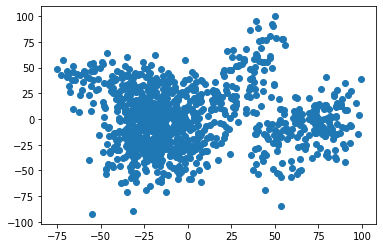

In [9]:
pca = PCA(n_components=None, svd_solver='full')
pca_components = pca.fit_transform(normalized)
plt.scatter(pca_components[:,0], pca_components[:,1])
plt.show()

In [61]:
pca = PCA(n_components=0.9999, svd_solver='full')
pca_components = pca.fit_transform(normalized)
pca_components.shape

(1067, 1065)

In [79]:
pd.DataFrame(pca_components, index=gene_expression.index).to_csv("/data/g0017139/MAFIA/gene_expression_PCA.dat", sep = " ",header=False, index=False)

In [10]:
from babyplots import Babyplot
bp = Babyplot()
bp.add_plot(pca_components[:,[0, 1, 2]].tolist(), "pointCloud", "categories", 
            colors1, options={'size': 4, 'colorScale': 'tab20'})
bp

<IPython.core.display.Javascript object>

# UMAP

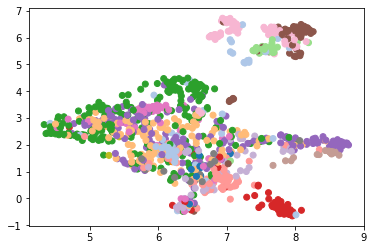

In [12]:
um = umap.UMAP(n_components=3,n_neighbors=90, min_dist=0.1,  random_state=42)
umap_components = um.fit_transform(normalized)
plt.scatter(umap_components[:,0], umap_components[:,1], c=colors)
plt.show()

In [13]:
bp = Babyplot()
bp.add_plot(umap_components[:,[0, 1, 2]].tolist(), "pointCloud", "categories", 
            colors1, options={'size': 4, 'colorScale': 'tab20'})
bp

<IPython.core.display.Javascript object>

In [14]:
results_grid = {}

# K-means

In [15]:
with open('Gridsearch/kmeans.pkl', 'rb') as f:
        results_grid['kMeans'] = pickle.load(f)

In [16]:
results_grid['kMeans'].sort_values('silhouette_score', axis=0, ascending=False).head(4)

,silhouette_score,calinski_harabasz_score,davies_bouldin_score,Fit_Time,n_clusters,batch_size
2,0.104322,66.925385,3.049233,4.480711,2,512
3,0.104322,66.925385,3.049233,10.363422,2,1024
1,0.104322,66.925385,3.049233,2.701703,2,256
0,0.102786,67.610557,3.551061,3.504158,2,128


In [17]:
results_grid['kMeans'].sort_values('calinski_harabasz_score', axis=0, ascending=False).head(4)

,silhouette_score,calinski_harabasz_score,davies_bouldin_score,Fit_Time,n_clusters,batch_size
0,0.102786,67.610557,3.551061,3.504158,2,128
1,0.104322,66.925385,3.049233,2.701703,2,256
2,0.104322,66.925385,3.049233,4.480711,2,512
3,0.104322,66.925385,3.049233,10.363422,2,1024


In [53]:
results_grid['kMeans'].sort_values('davies_bouldin_score', axis=0, ascending=True).head(4)

,silhouette_score,calinski_harabasz_score,davies_bouldin_score,Fit_Time,n_clusters,batch_size
108,0.025132,13.280505,2.782406,3.960789,29,128
24,0.014156,27.547398,2.844376,1.712835,8,128
84,-0.015535,14.354837,2.888636,2.801019,23,128
92,0.013423,14.681346,2.952778,2.884066,25,128


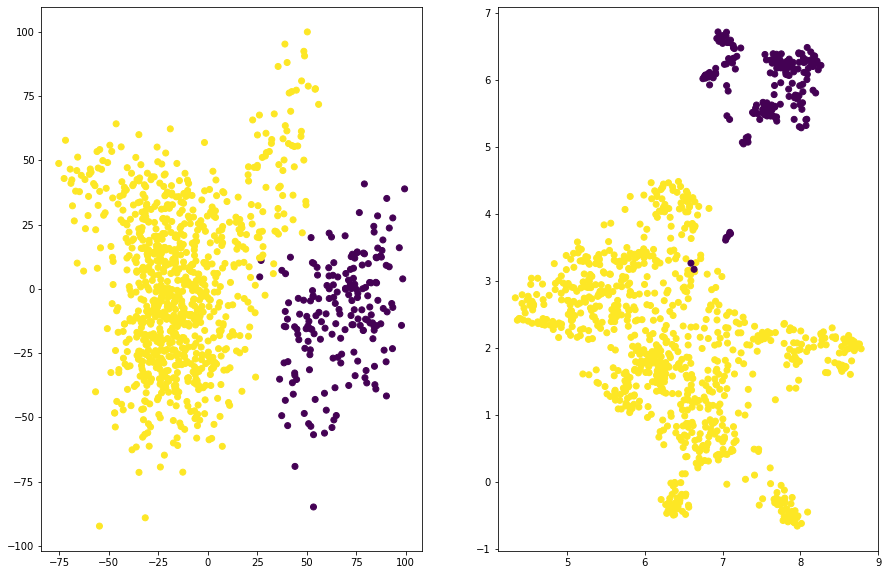

In [19]:
kmeans = MiniBatchKMeans(n_clusters=2,
                         random_state=0,
                         batch_size=256)
kmeans.fit(normalized)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,10))
ax1.scatter(pca_components[:,0], pca_components[:,1], c=kmeans.labels_)
ax2.scatter(umap_components[:,0], umap_components[:,1], c=kmeans.labels_)
plt.show()

In [20]:
bp = Babyplot()
bp.add_plot(umap_components[:,[0, 1, 2]].tolist(), "pointCloud", "categories", 
            kmeans.labels_.tolist(), options={'size': 4, 'colorScale': 'tab20'})
bp

<IPython.core.display.Javascript object>

# UMAP + DBSCAN

In [21]:
with open('Gridsearch/dbscan.pkl', 'rb') as f:
        results_grid['dbscan'] = pickle.load(f)

In [22]:
results_grid['dbscan'].sort_values('silhouette_score', axis=0, ascending=False).head(70)

,silhouette_score,calinski_harabasz_score,davies_bouldin_score,Fit_Time,DimReduction__n_neighbors,DimReduction__min_dist,DimReduction__n_components,Clustering__min_cluster_size,Clustering__min_samples,Clustering__cluster_selection_epsilon,Clustering__cluster_selection_method
4109,0.104322,66.925385,3.049233,11.263907,70,0.0,1,25,100,1.0,leaf
1025,0.104322,66.925385,3.049233,14.214439,30,0.5,26,100,2,1.0,leaf
4144,0.104322,66.925385,3.049233,11.438559,70,0.0,1,75,2,1.0,eom
4190,0.104322,66.925385,3.049233,11.158019,70,0.0,1,100,75,0.5,eom
4143,0.104322,66.925385,3.049233,11.323849,70,0.0,1,75,2,0.5,leaf
...,...,...,...,...,...,...,...,...,...,...,...
548,0.104322,66.925385,3.049233,11.255038,30,0.0,1,75,25,0.5,eom
546,0.104322,66.925385,3.049233,11.249145,30,0.0,1,75,25,0.1,eom
543,0.104322,66.925385,3.049233,11.262009,30,0.0,1,75,2,0.5,leaf
545,0.104322,66.925385,3.049233,11.224259,30,0.0,1,75,2,1.0,leaf


In [23]:
results_grid['dbscan'].sort_values('calinski_harabasz_score', axis=0, ascending=False).head(4)

,silhouette_score,calinski_harabasz_score,davies_bouldin_score,Fit_Time,DimReduction__n_neighbors,DimReduction__min_dist,DimReduction__n_components,Clustering__min_cluster_size,Clustering__min_samples,Clustering__cluster_selection_epsilon,Clustering__cluster_selection_method
4198,0.104322,66.925385,3.049233,11.146416,70,0.0,1,100,100,1.0,eom
579,0.104322,66.925385,3.049233,11.185337,30,0.0,1,100,25,0.5,leaf
587,0.104322,66.925385,3.049233,11.178829,30,0.0,1,100,50,1.0,leaf
586,0.104322,66.925385,3.049233,11.526709,30,0.0,1,100,50,1.0,eom


In [51]:
results_grid['dbscan'].sort_values('davies_bouldin_score', axis=0, ascending=False).head(4)

,silhouette_score,calinski_harabasz_score,davies_bouldin_score,Fit_Time,DimReduction__n_neighbors,DimReduction__min_dist,DimReduction__n_components,Clustering__min_cluster_size,Clustering__min_samples,Clustering__cluster_selection_epsilon,Clustering__cluster_selection_method
6995,0.007171,34.107106,10.503076,17.211624,90,1.0,26,75,2,1.0,leaf
6994,0.007171,34.107106,10.503076,17.154165,90,1.0,26,75,2,1.0,eom
7022,0.007171,34.107106,10.503076,16.901046,90,1.0,26,100,2,0.5,eom
7020,0.007171,34.107106,10.503076,17.052686,90,1.0,26,100,2,0.1,eom


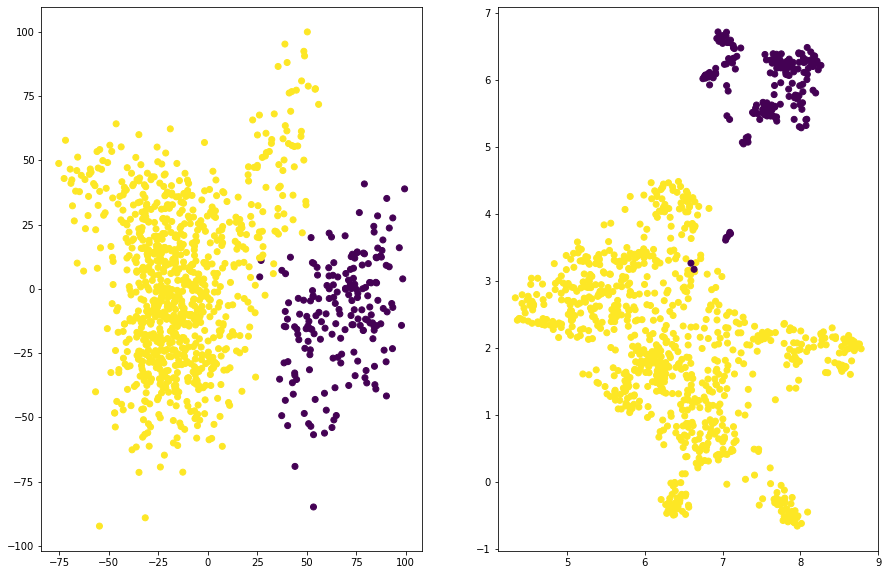

In [25]:
pipe = Pipeline([('DimReduction', 
                  umap.UMAP(
                      n_neighbors=70,
                      min_dist=0.0,
                      n_components=1,
                      random_state=42)),
                 ('Clustering', 
                 hdbscan.HDBSCAN(min_cluster_size=25,
                                min_samples=100,
                                cluster_selection_epsilon=1.0,
                                cluster_selection_method='leaf'))
                ])
pipe.fit(normalized)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,10))
ax1.scatter(pca_components[:,0], pca_components[:,1], c=pipe['Clustering'].labels_)
ax2.scatter(umap_components[:,0], umap_components[:,1], c=pipe['Clustering'].labels_)
plt.show()

In [26]:
bp = Babyplot(show_ui=False)
bp.add_plot(umap_components[:,[0, 1, 2]].tolist(), "pointCloud", "categories", 
            pipe['Clustering'].labels_.tolist(), options={'size': 4, 'colorScale': 'tab20'},
            )
bp

<IPython.core.display.Javascript object>

# What is special about these 2 clusters

In [ ]:
import seaborn as sns
result['cluster'] = pipe['Clustering'].labels_
sns.catplot(x="cluster", hue="TYPE", kind="count",
            palette="tab20", edgecolor=".6",
            data=result)
plt.savefig('IMAGES/ClusterResults.png')
plt.show()

# HDDC

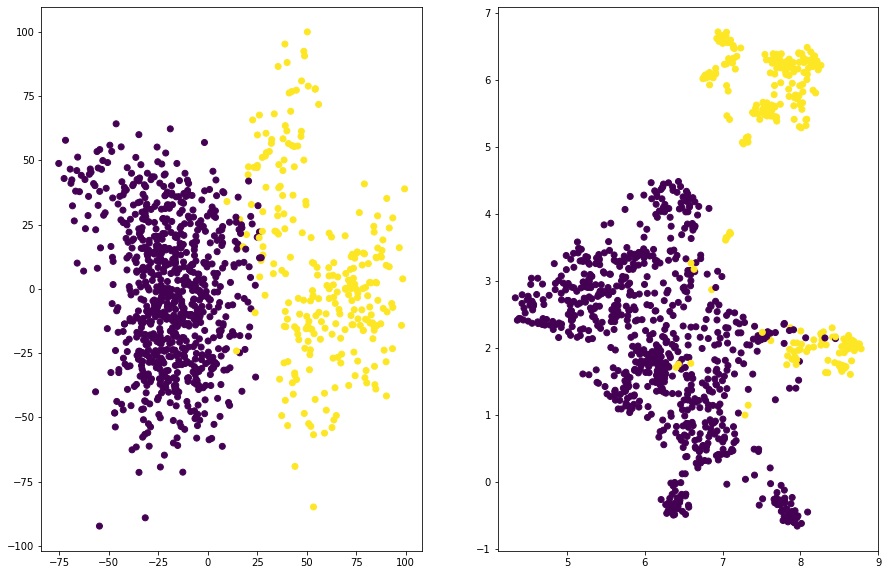

In [55]:
results_grid['hddc'] = pd.read_csv('Results/HDDCGrid.csv', index_col=0)
results_grid['hddc'] = results_grid['hddc'].T.reset_index(drop=True)
clusters = pd.read_csv('Results/HDDCClusters.csv', index_col=0).values.ravel()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,10))
ax1.scatter(pca_components[:,0], pca_components[:,1], c=clusters)
ax2.scatter(umap_components[:,0], umap_components[:,1], c=clusters)
plt.show()

In [56]:
results_grid['hddc']

,model,K,threshold,LL,BIC,ICL,rank,originalOrder,complexity
0,12.0,2.0,0.01,-2.344247e+07,-5.304252e+07,-5.304252e+07,1.0,1.0,883109.0
1,8.0,2.0,0.01,-2.344605e+07,-5.304939e+07,-5.304939e+07,2.0,2.0,883068.0
2,14.0,2.0,0.01,-2.347949e+07,-5.311654e+07,-5.311654e+07,3.0,4.0,883108.0
3,14.0,3.0,0.10,-2.493278e+07,-5.369822e+07,-5.369822e+07,4.0,214.0,549673.0
4,10.0,3.0,0.10,-2.493349e+07,-5.369947e+07,-5.369947e+07,5.0,215.0,549651.0
...,...,...,...,...,...,...,...,...,...
583,6.0,9.0,0.01,1.779610e+06,-5.611360e+09,-5.611360e+09,584.0,111.0,726127.0
584,3.0,11.0,0.01,1.528116e+06,-5.611414e+09,-5.611414e+09,585.0,140.0,765372.0
585,6.0,12.0,0.01,2.141054e+06,-5.611435e+09,-5.611435e+09,586.0,153.0,785035.0
586,6.0,11.0,0.01,1.688869e+06,-5.611435e+09,-5.611435e+09,587.0,139.0,765399.0


In [57]:
bp = Babyplot(show_ui=True)
bp.add_plot(umap_components[:,[0, 1, 2]].tolist(), "pointCloud", "categories", 
            clusters.tolist(), options={'size': 4, 'colorScale': 'tab20'},
            )
bp

<IPython.core.display.Javascript object>

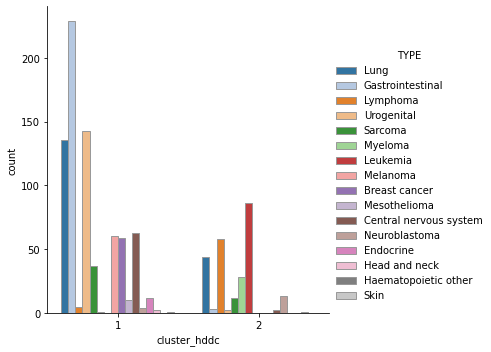

In [42]:
import seaborn as sns
result['cluster_hddc'] = clusters
sns.catplot(x="cluster_hddc", hue="TYPE", kind="count",
            palette="tab20", edgecolor=".6",
            data=result)
plt.savefig('IMAGES/ClusterResults_2.png')
plt.show()

In [45]:
from Gridsearch.gridsearch import get_score
get_score(normalized, clusters)

{'silhouette_score': 0.10504558974643793,
 'calinski_harabasz_score': 67.63755797424253,
 'davies_bouldin_score': 3.509215345401019}

# MAFIA

In [73]:
import os

test = np.arange(0,len(normalized))
rows = []
clusters = []
directory = 'Results'
for filename in tqdm(os.listdir(directory)):
    if filename.endswith(".idx"):
        loadedrow = pd.read_table(f"{directory}/{filename}",sep="  ", header=None, engine='python').values.tolist()
        clusters.extend(np.repeat(int(filename.split('-')[1].replace('.idx','')), len(loadedrow)))
        rows.extend(loadedrow)
        
rows = np.array(rows).ravel()
        
clusters = np.array(clusters)

for x in test:
    if x not in rows:
        rows = np.append(rows, x)
        clusters = np.append(clusters, -1)

100%|██████████| 13422/13422 [00:27<00:00, 481.87it/s]


In [74]:
rows_to_cluster = pd.DataFrame(clusters, index=rows)
rows_to_cluster = rows_to_cluster[~rows_to_cluster.index.duplicated(keep='last')]
rows_to_cluster = rows_to_cluster.sort_index()

# What is special about these 2 clusters

In [ ]:
# import seaborn as sns
# result['cluster'] = pipe['Clustering'].labels_
# sns.catplot(x="cluster", hue="TYPE", kind="count",
#             palette="tab20", edgecolor=".6",
#             data=result)
# plt.savefig('IMAGES/ClusterResults.png')
# plt.show()

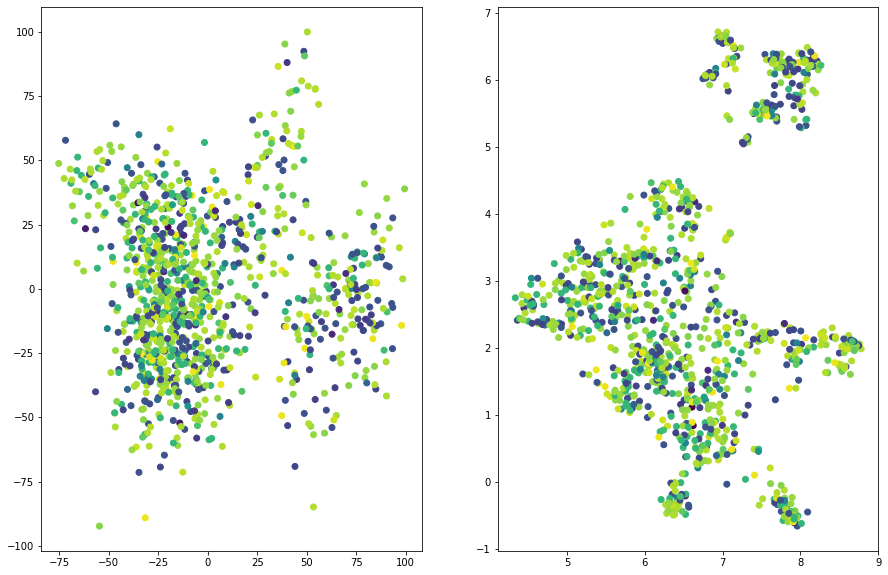

In [76]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,10))
ax1.scatter(pca_components[:,0], pca_components[:,1], c=rows_to_cluster)
ax2.scatter(umap_components[:,0], umap_components[:,1], c=rows_to_cluster)
plt.show()

In [77]:
get_score(normalized, rows_to_cluster)

/data/g0017139/.envs/ClusterEnv/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/data/g0017139/.envs/ClusterEnv/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/data/g0017139/.envs/ClusterEnv/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


{'silhouette_score': -0.12148263712275696,
 'calinski_harabasz_score': 1.1250891032159709,
 'davies_bouldin_score': 5.8367306590845445}